In [3]:
import os
import sys
from decimal import Decimal

module_path = os.path.abspath(os.path.join('../../..'))
if module_path not in sys.path:
    sys.path.append(module_path)
from methods import main_methods as mm

module_path = os.path.abspath(os.path.join('..'))
if module_path not in sys.path:
    sys.path.append(module_path)
import segmentation_gmm as seg_gmm
import segmentation_watershed as seg_water
import ssts_helpers as sh

import numpy as np
import pandas as pd
import scipy.stats as stats
import matplotlib.pyplot as plt
%matplotlib inline

In [2]:
qnm_fields = ['Adhesion', 'Deformation', 'Dissipation', 'Modulus', 'Height', 'Stiffness']

In [3]:
lit_files = '/Users/wesleytatum/Dropbox/SSTS_files/Manuscript/data_files/'

im1_0deg = np.load(lit_files+'P3HT-PCBM_150C_15min_0deg.npy')
im2_90deg = np.load(lit_files+'P3HT-PCBM_150C_15min_90deg.npy')
im3_annealed = np.load(lit_files+'P3HT-PCBM_150C_15min_sub2.npy')
im4_no_anneal = np.load(lit_files+'P3HT-PCBM_no-anneal.npy')
im5_PTB7 = np.load(lit_files+'PTB7PC71BM_CBonly_ascast_fresh_500 nm_combined.npy')
im6_OFET = np.load(lit_files+'150C_30min_8_3_combined.npy')
im7_NWs = np.load(lit_files+'100-0_72_NW_combined.npy')

ims = [im1_0deg, im2_90deg, im3_annealed, im4_no_anneal, im5_PTB7, im6_OFET, im7_NWs]

## Define iterable classification workflow

In [4]:
def ssts_pipeline(dataframe, heightless, n_components, padding, embedding_dim, nonlinear, plots):
    """
    Wrapper function for SSTS tools. Allows to include or exclude SSTS tools in the order shown in the code.
    
    Args:
    dataframe - np.array(). 3D array of SPM data
    heightless - bool. if 'True', height channel is removed. Height is assumed to be dataframe[:,:,4]
    n_components - int. number specifying the number of Gaussian phase distributions to be identified in dataframe
    padding - int. number specifying the degree of closeness of neighbors to be included in GMM labelling
    embedding_dims - int. number specifying the number of principle components to use in PCA before GMM labelling
    nonlinear - bool. if 'True', nonlinear properties are generated prior to analysis. Includes x^2, x^3, abs(x),
                and 1/x
                
    Returns:
    outliers - np.array(). 2D array of outliers
    seg1_labels - np.array(). 2D array of GMM labels
    seg2_labels - np.array(). 2D array of clustering labels
    """
    # Apply frequency removal
    data = mm.apply_frequency_removal(dataframe)

    # Extract outliers
    outliers = mm.extract_outliers(data)
    no_outliers_data = np.copy(data)
    no_outliers_data[outliers==1] = 0
    if plots == True:
        mm.show_outliers(data, outliers)
    else:
        pass

    # Remove height property (optional)
    no_height_data = np.delete(no_outliers_data, 4, axis=2)

    if plots == True:
        # Show a-priori distributions
        mm.show_property_distributions(data, outliers)
    else:
        pass

    # Run GMM segmentation
    seg1 = seg_gmm.SegmenterGMM(n_components = n_components, embedding_dim = embedding_dim,
                                padding = padding, nonlinear = nonlinear)

    if heightless == True:
        # Remove height property
        no_height_data = np.delete(no_outliers_data, 4, axis=2)
        
        seg1_labels = seg1.fit_transform(no_height_data, outliers)
        if plots == True:
            mm.show_classification(seg1_labels, no_height_data)
            mm.show_distributions_together(seg1_labels, no_height_data)
        else:
            pass
        
        seg2_labels = seg1.get_grains(seg1_labels)
        if plots == True:
            mm.show_classification(seg2_labels, no_height_data)
        else:
            pass
        
    elif heightless == False:
        seg1_labels = seg1.fit_transform(no_outliers_data, outliers)
        if plots == True:
            mm.show_classification(seg1_labels, no_outliers_data)
            mm.show_distributions_together(seg1_labels, no_outliers_data)
        else:
            pass
        
        seg2_labels = seg1.get_grains(seg1_labels)
        if plots == True:
            mm.show_classification(seg2_labels, no_outliers_data)
        else:
            pass
        
    else:
        print ('Error: Heightless flag incorrect')
    
    return outliers, seg1_labels, seg2_labels

## Test iterable workflow on a single image

In [ ]:
dataframe = ims[2]
heightless = False
n_components = 4
padding = 0
embedding_dim = None
nonlinear = True
plots = True

outliers, seg1_labels, seg2_labels = ssts_pipeline(dataframe, heightless = heightless, n_components = n_components,
                                                   padding = padding, embedding_dim = embedding_dim,
                                                   nonlinear = nonlinear, plots = plots)

In [ ]:
phases = sh.phase_sort(dataframe,seg1_labels,n_components)
p_stats = sh.gen_phase_stats(phases)
p_stats

In [ ]:
grains = sh.grain_sort(dataframe, seg2_labels)
g_stats = sh.gen_grain_stats(grains)
g_stats

## Apply workflow to single image and iterate, varying a single hyper parameter (num_components)

/anaconda3/lib/python3.7/site-packages/scipy/fftpack/basic.py:160: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.
  z[index] = x


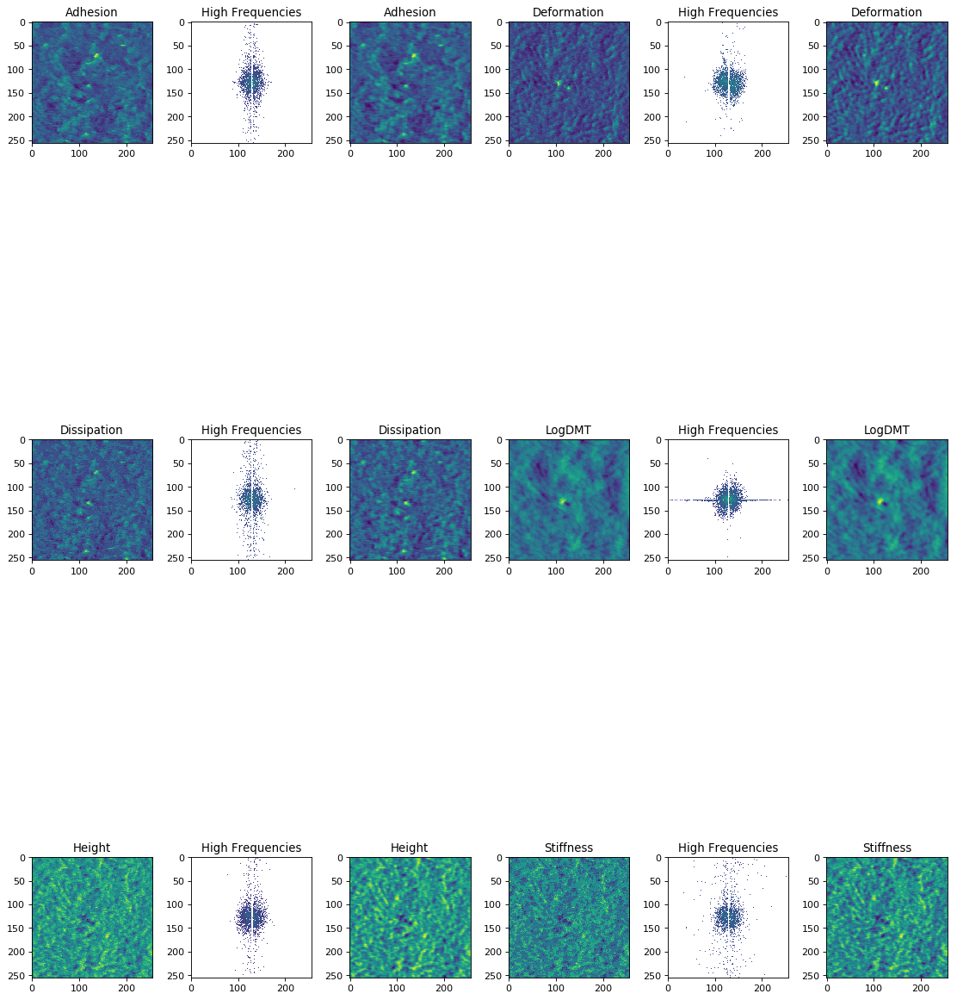

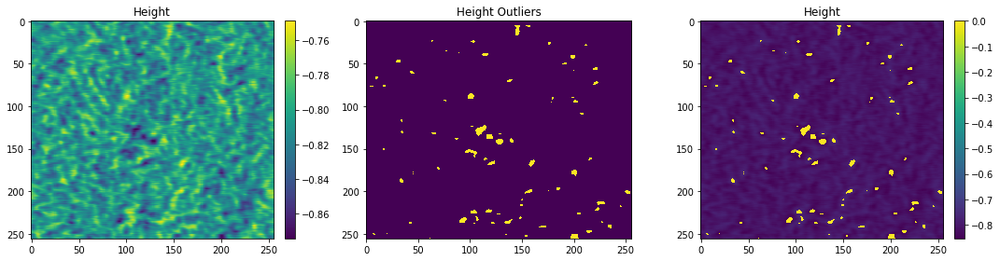

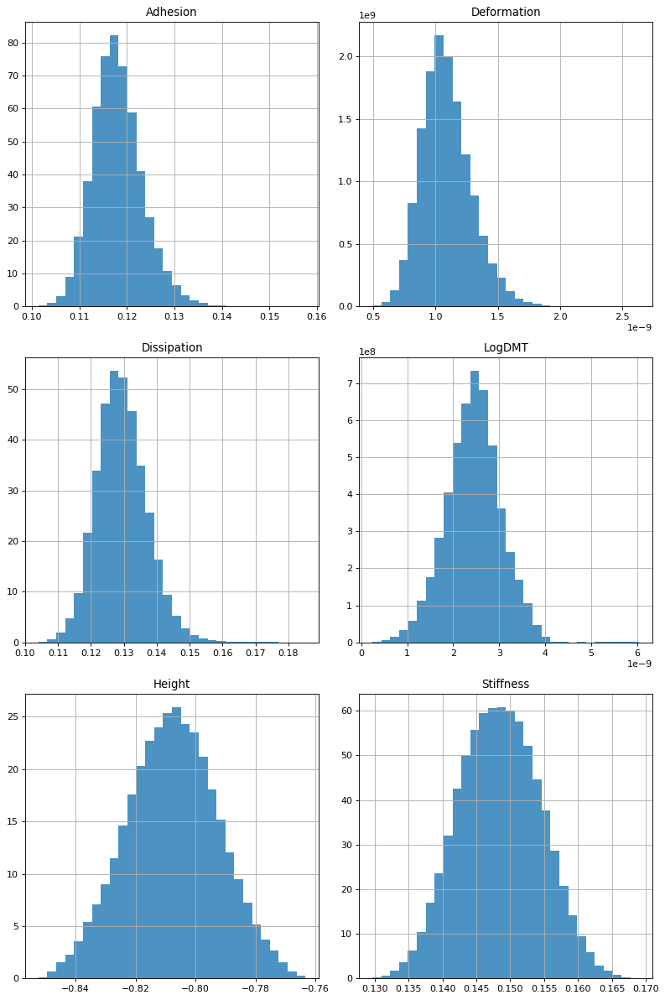

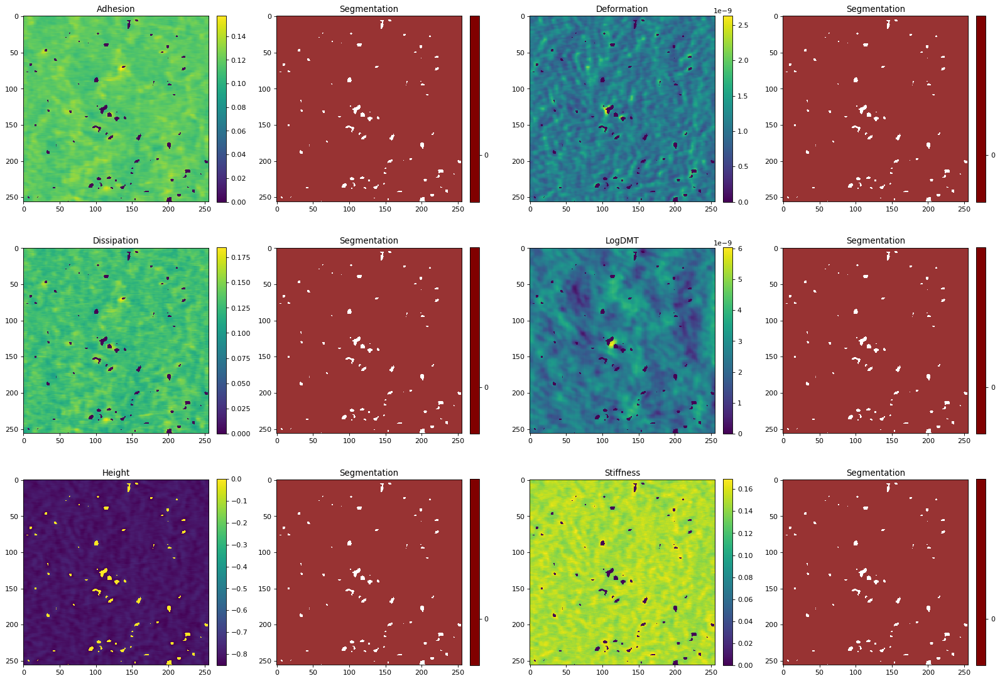

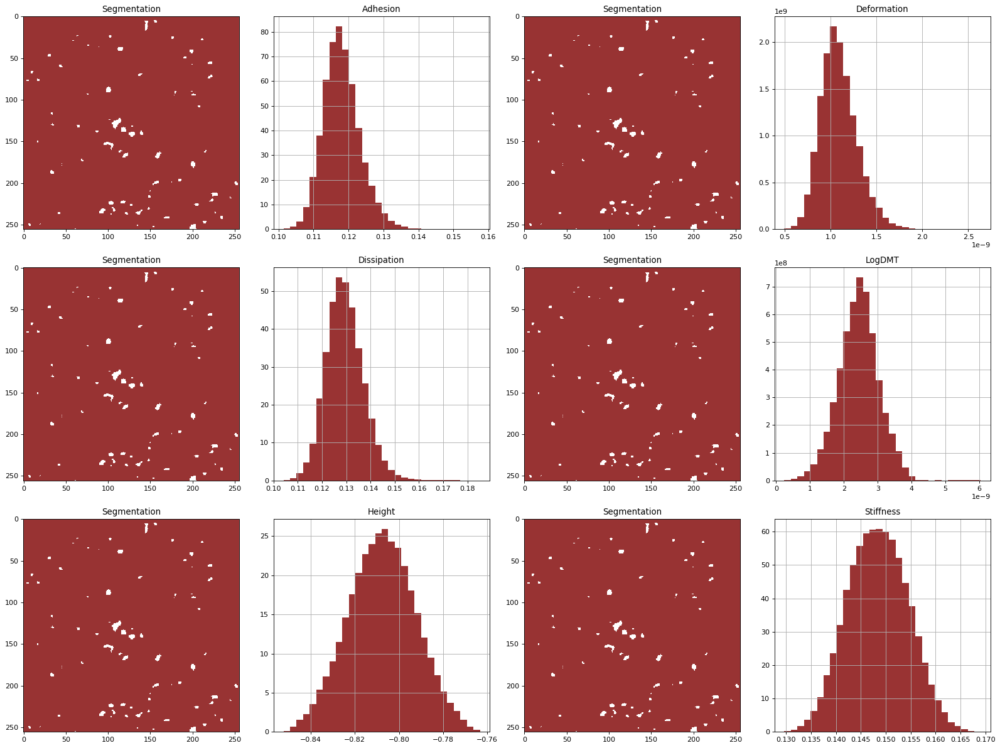

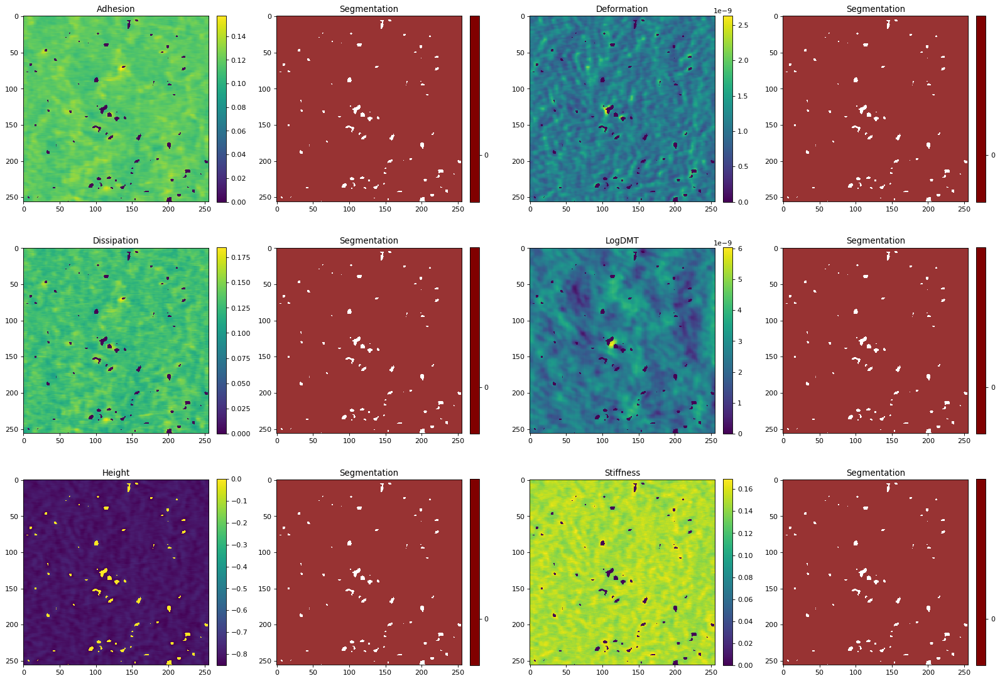

/anaconda3/lib/python3.7/site-packages/scipy/fftpack/basic.py:160: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.
  z[index] = x


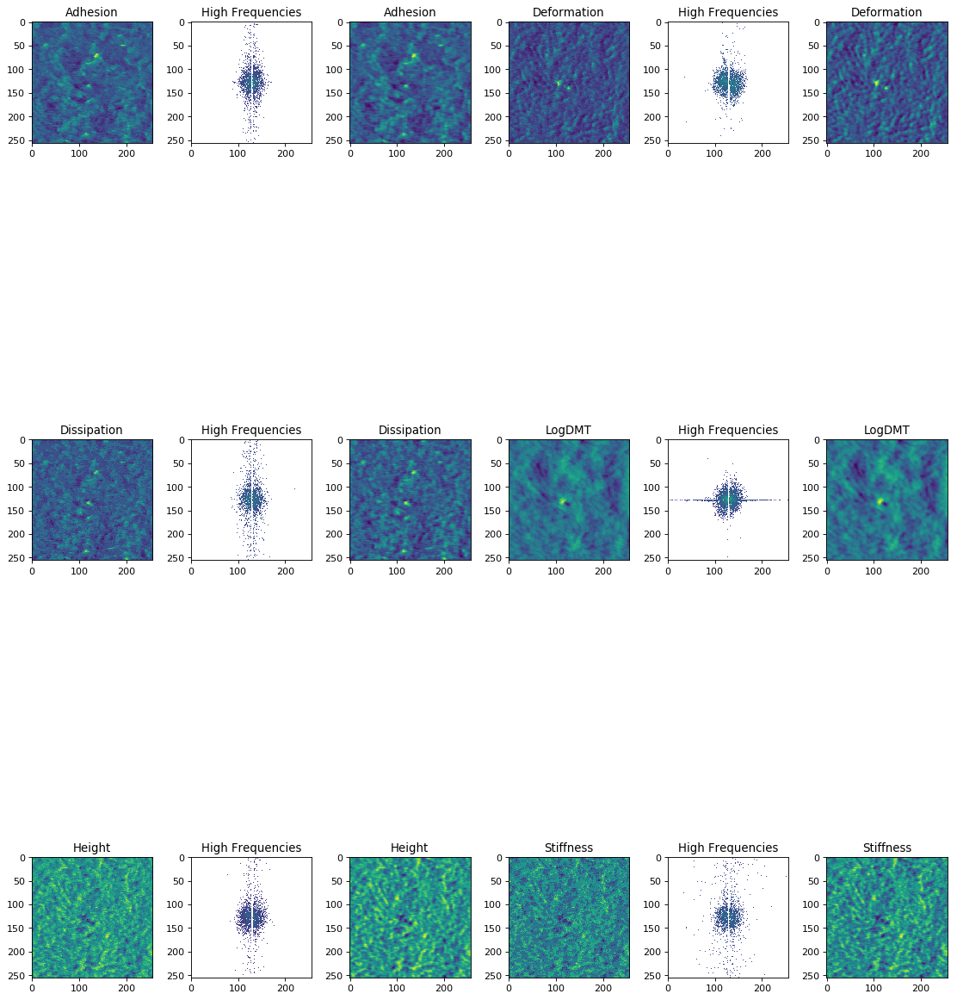

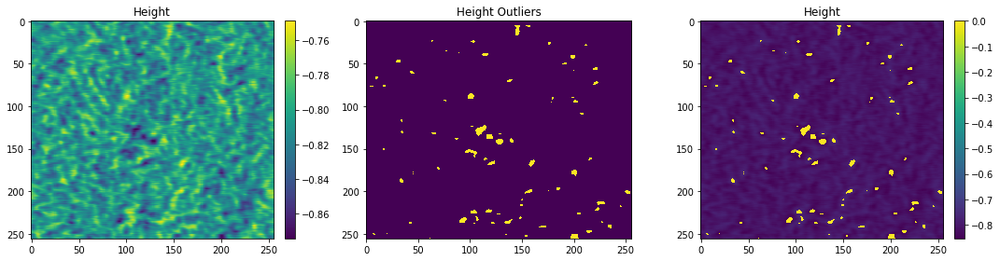

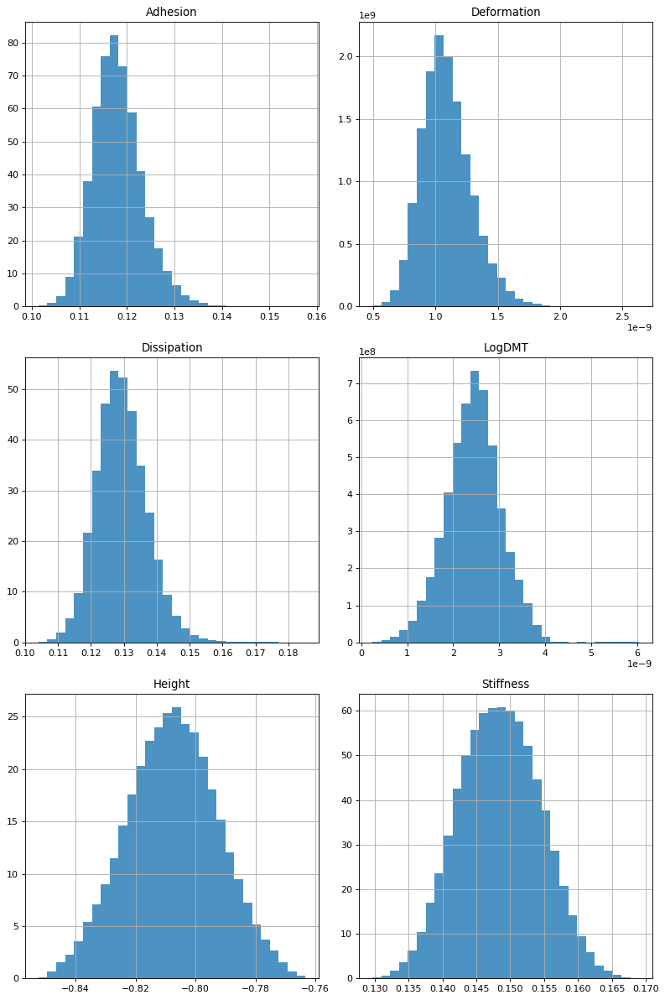

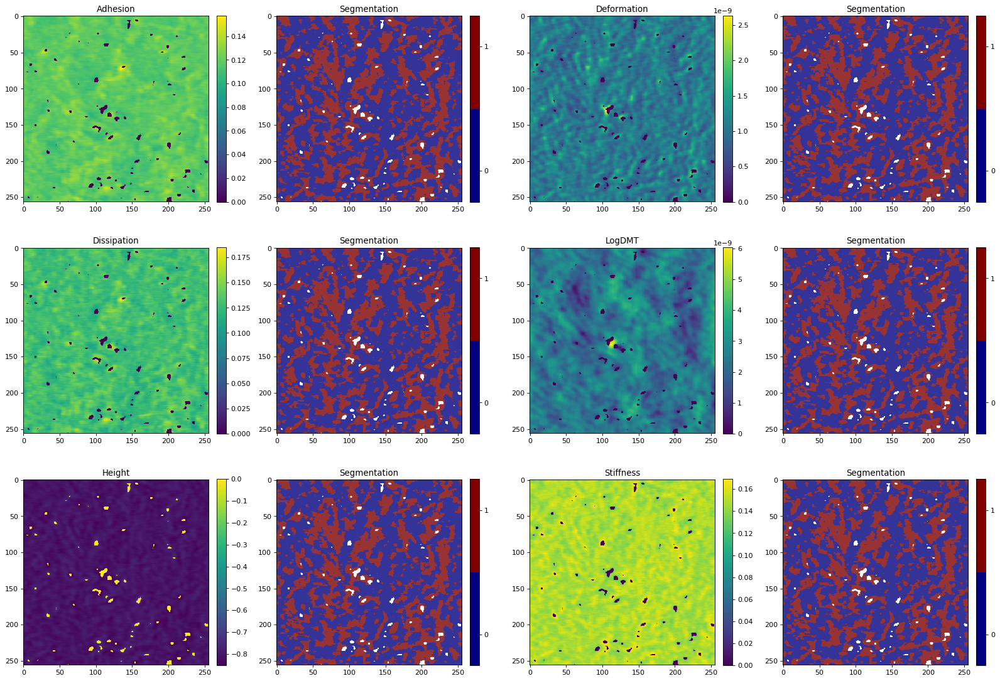

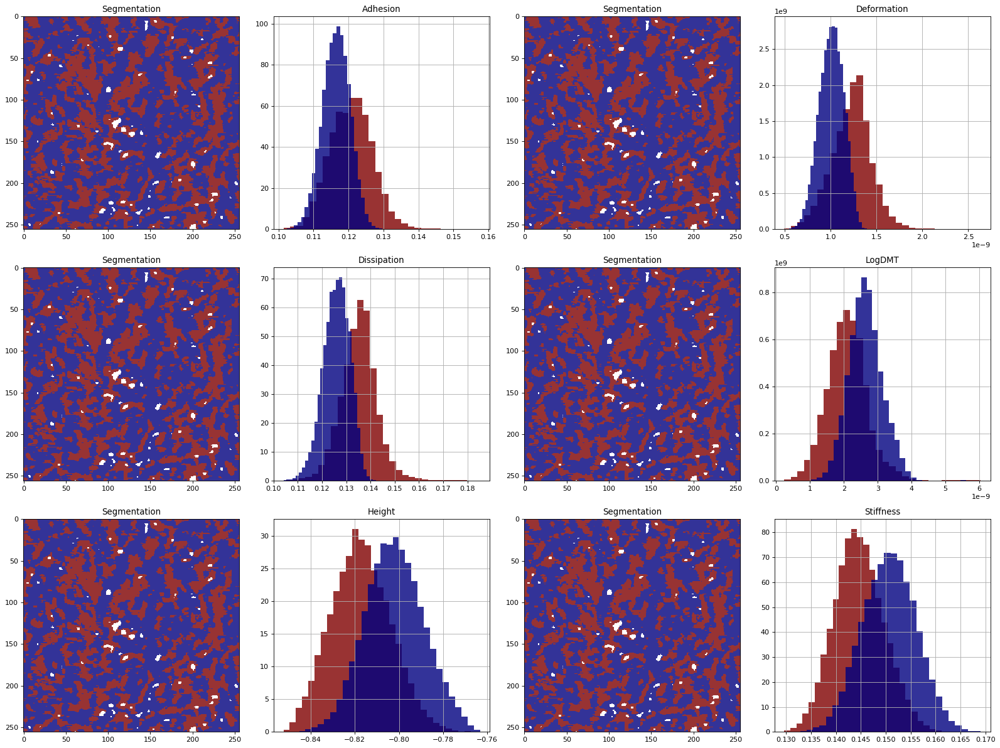

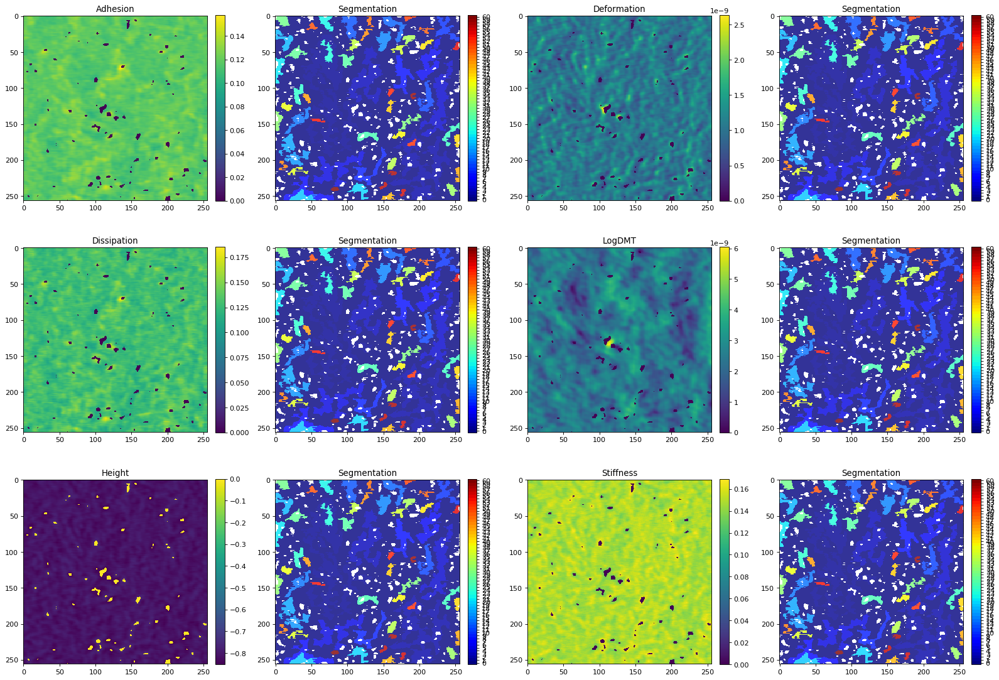

/anaconda3/lib/python3.7/site-packages/scipy/fftpack/basic.py:160: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.
  z[index] = x


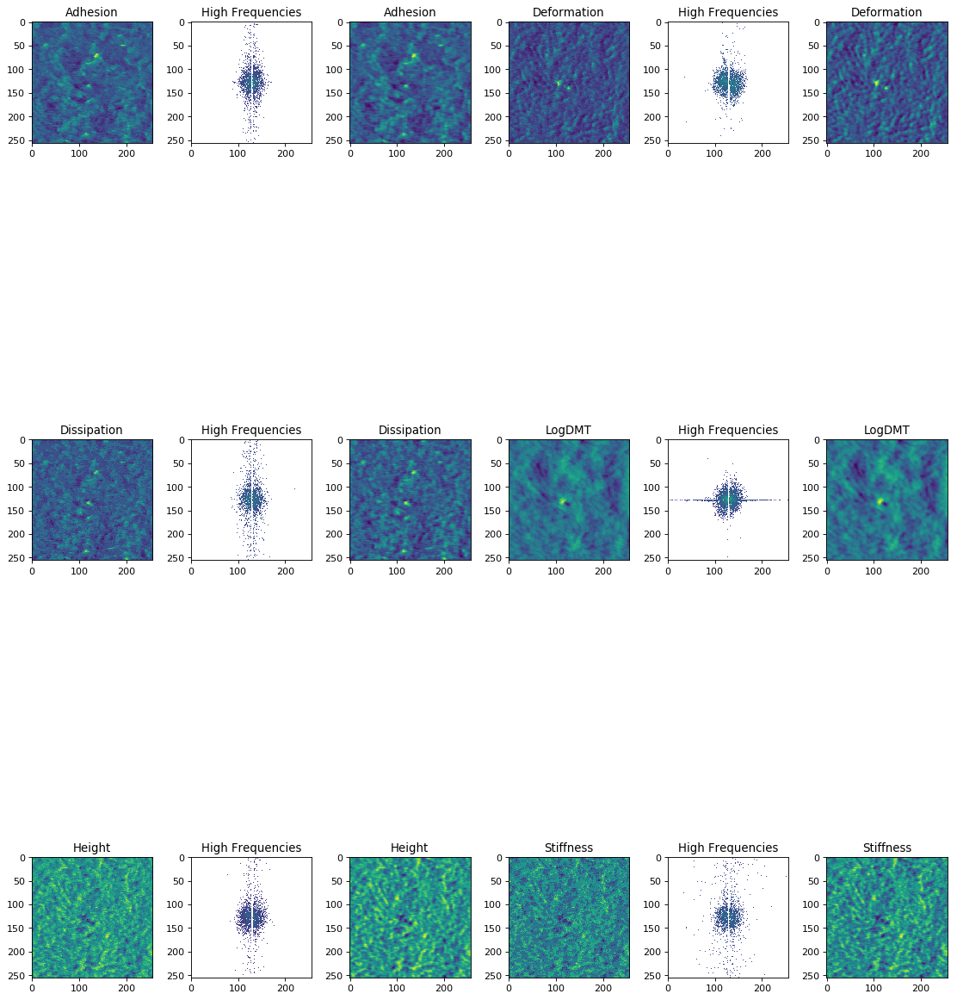

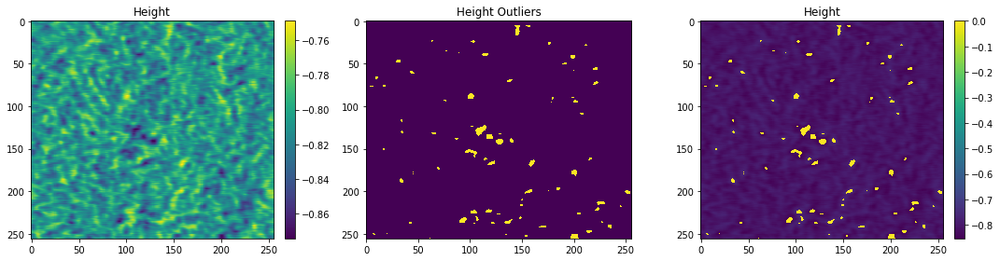

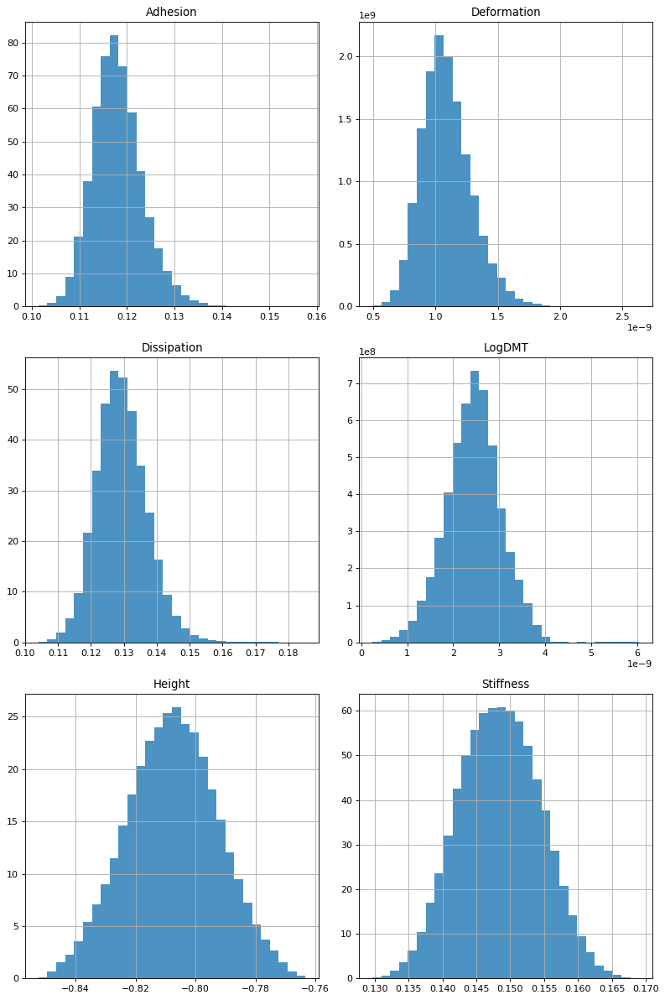

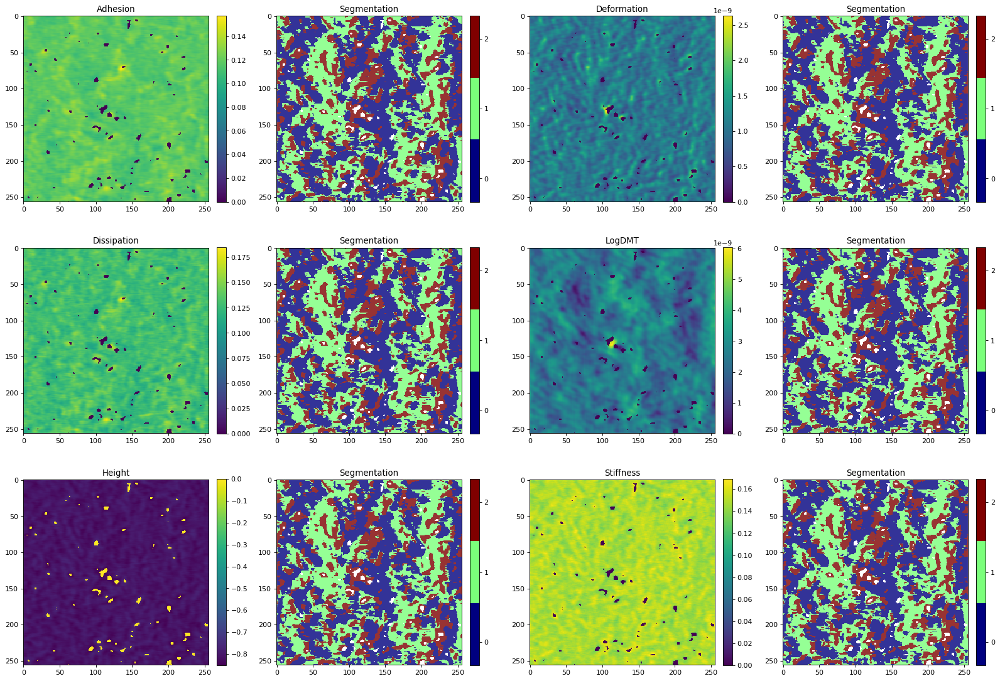

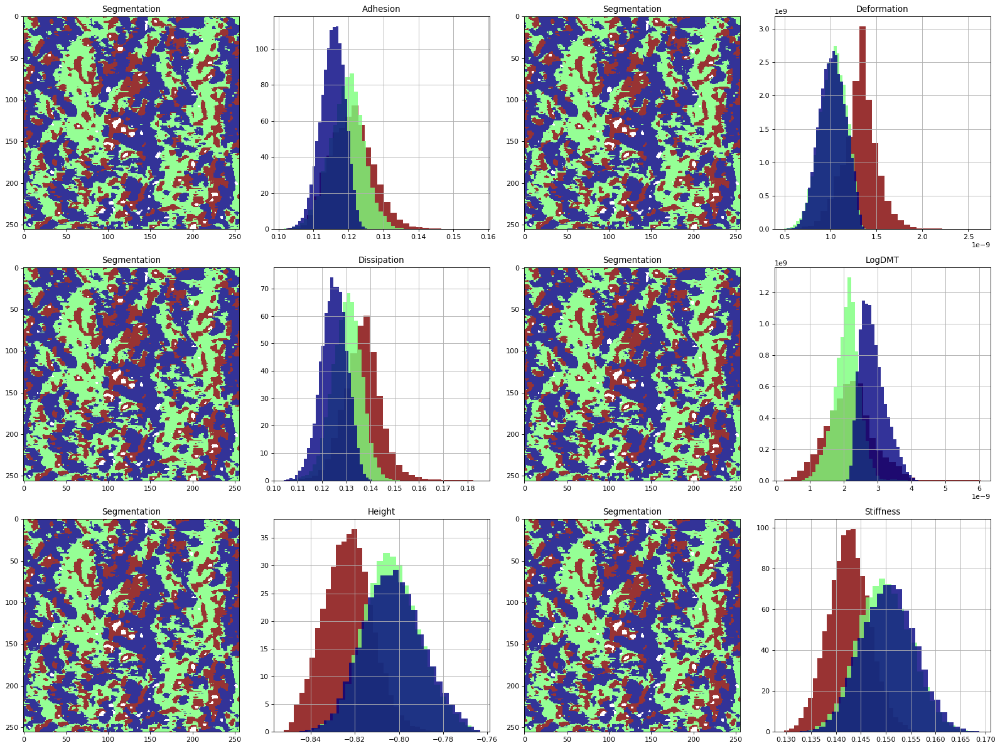

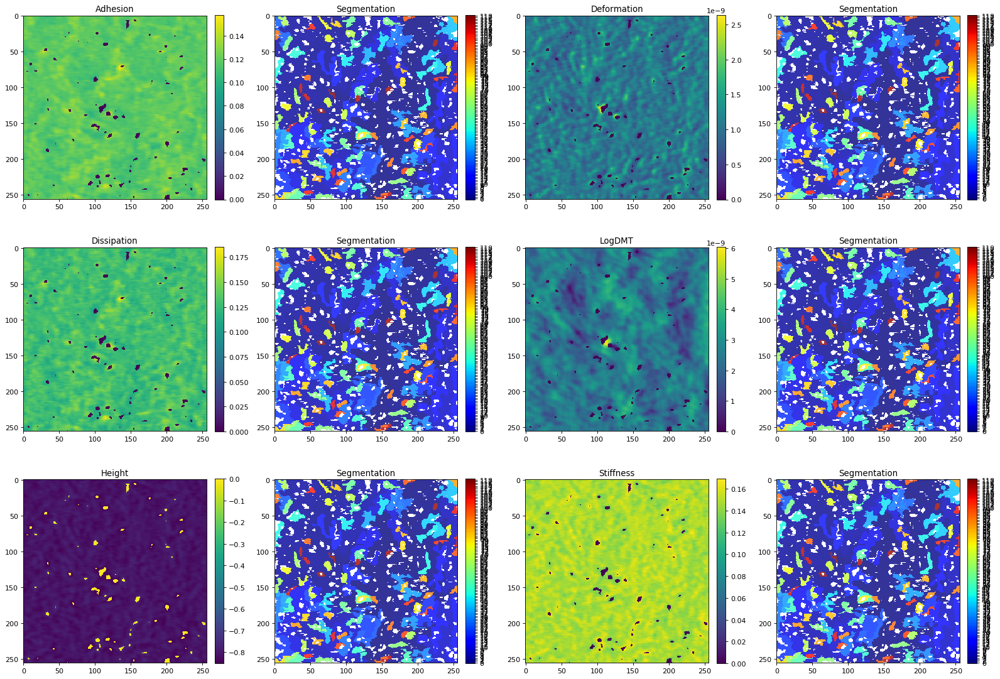

/anaconda3/lib/python3.7/site-packages/scipy/fftpack/basic.py:160: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.
  z[index] = x


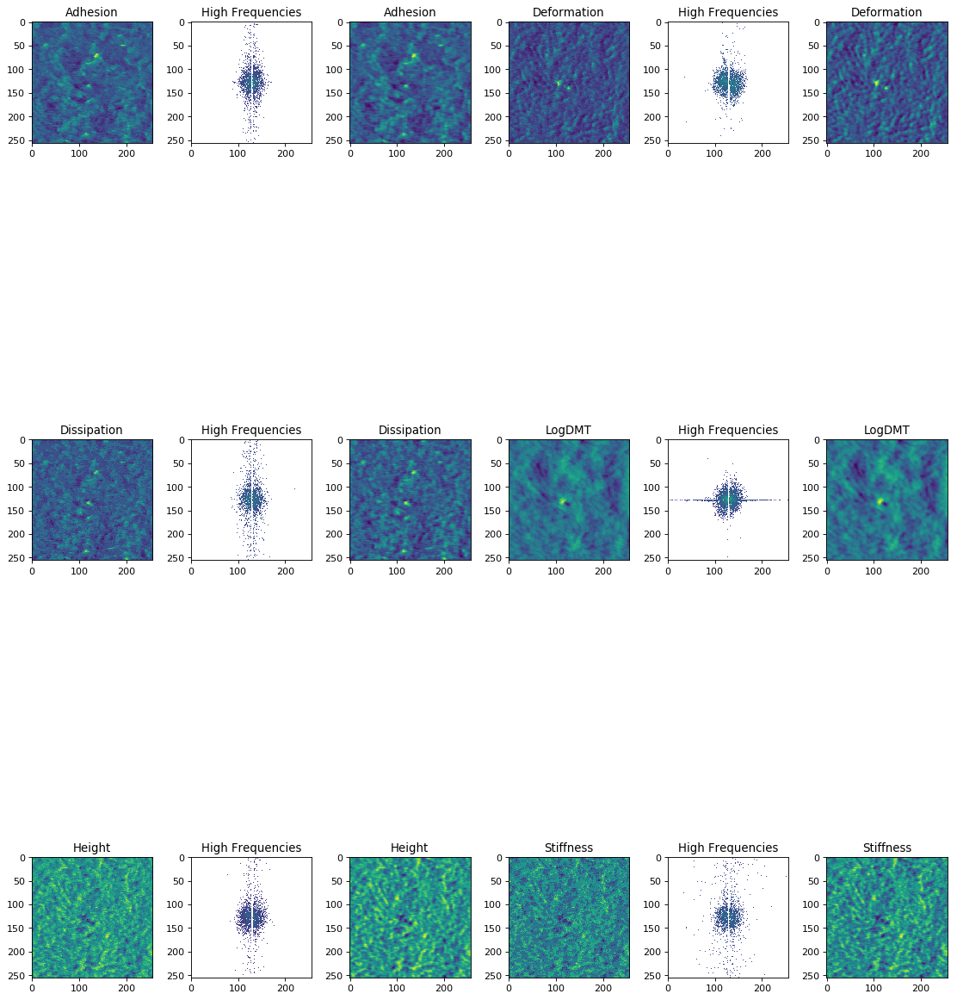

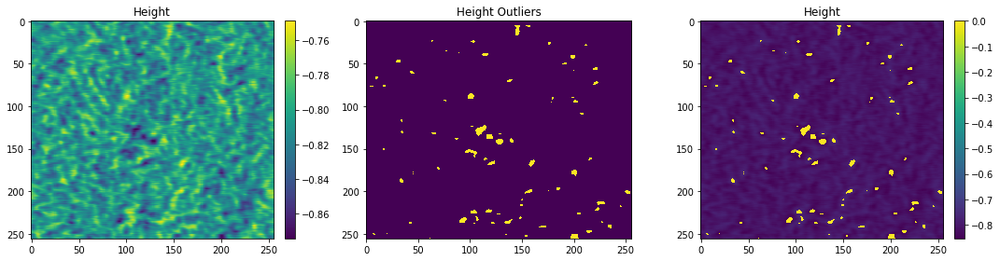

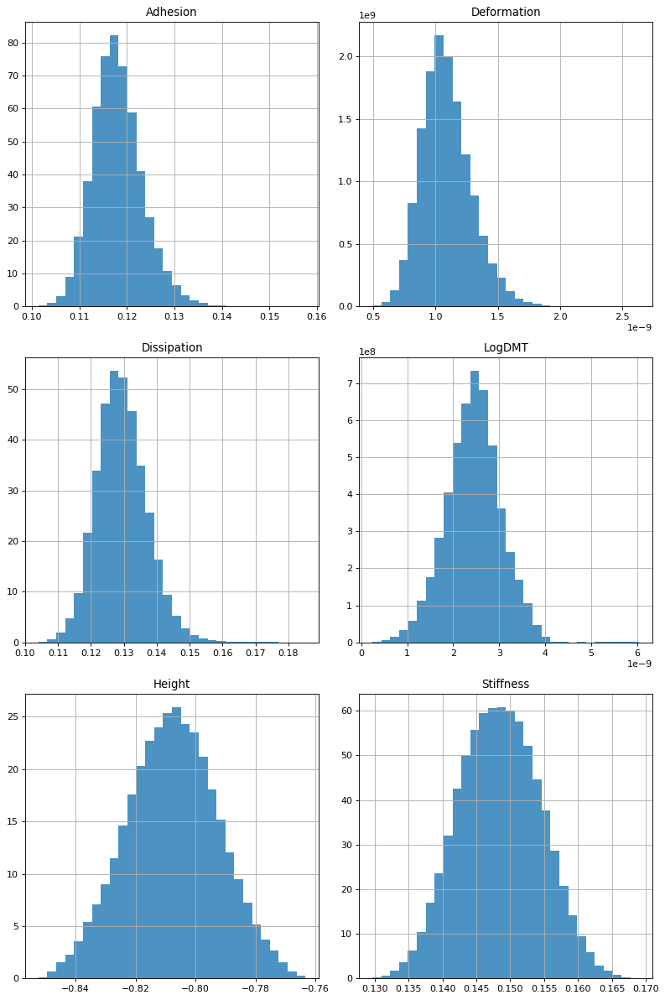

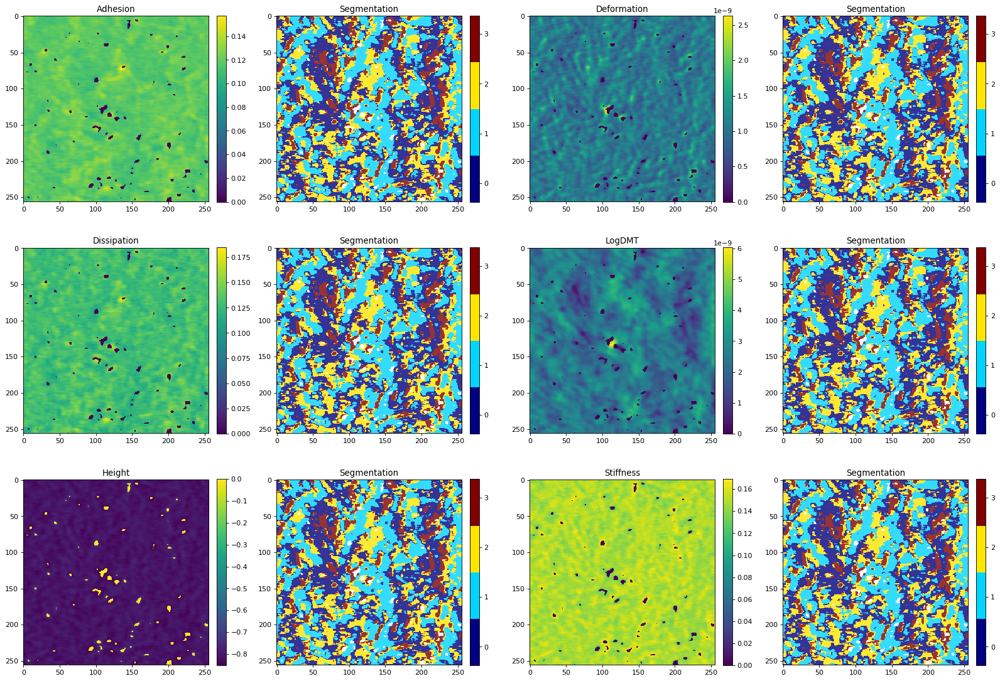

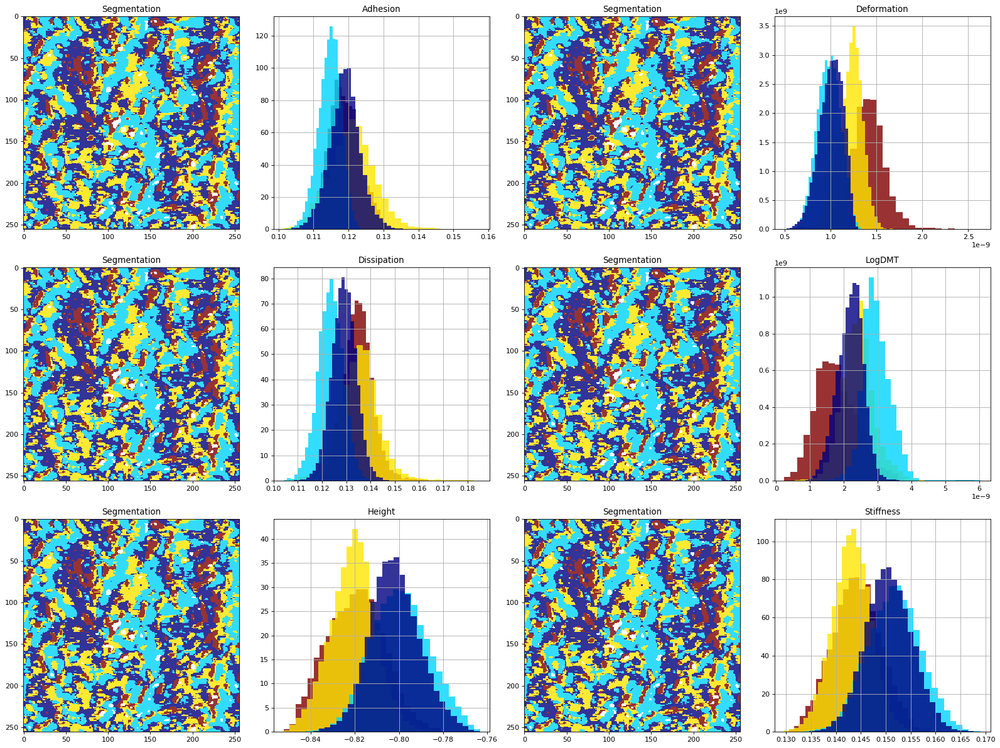

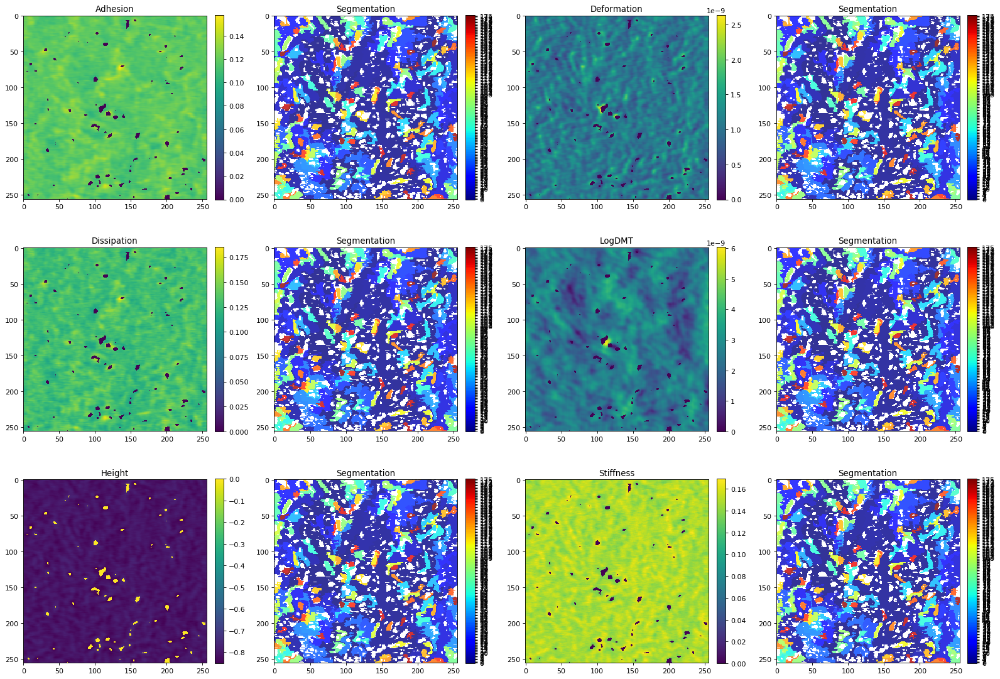

/anaconda3/lib/python3.7/site-packages/scipy/fftpack/basic.py:160: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.
  z[index] = x


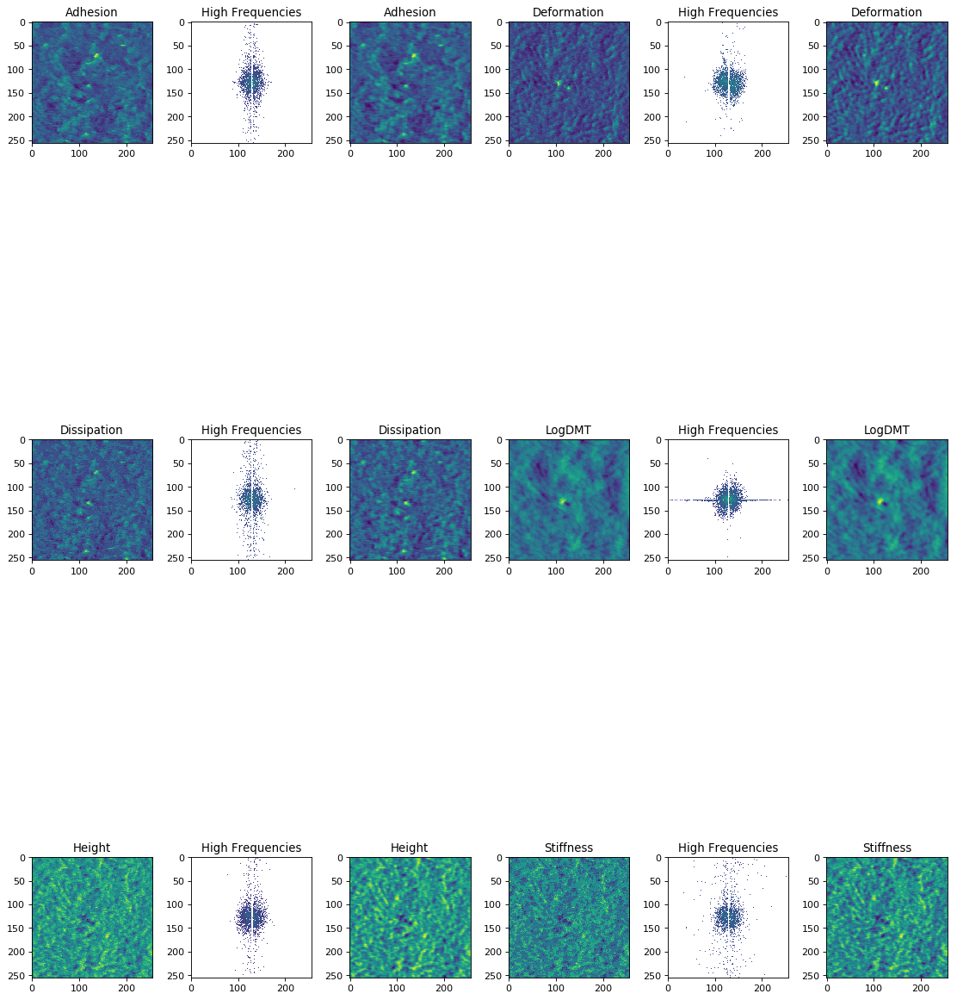

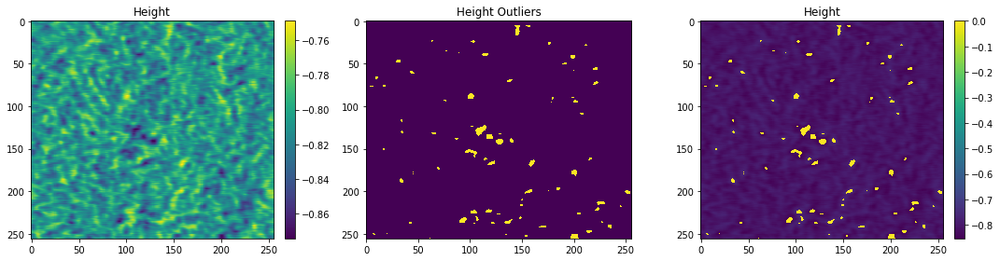

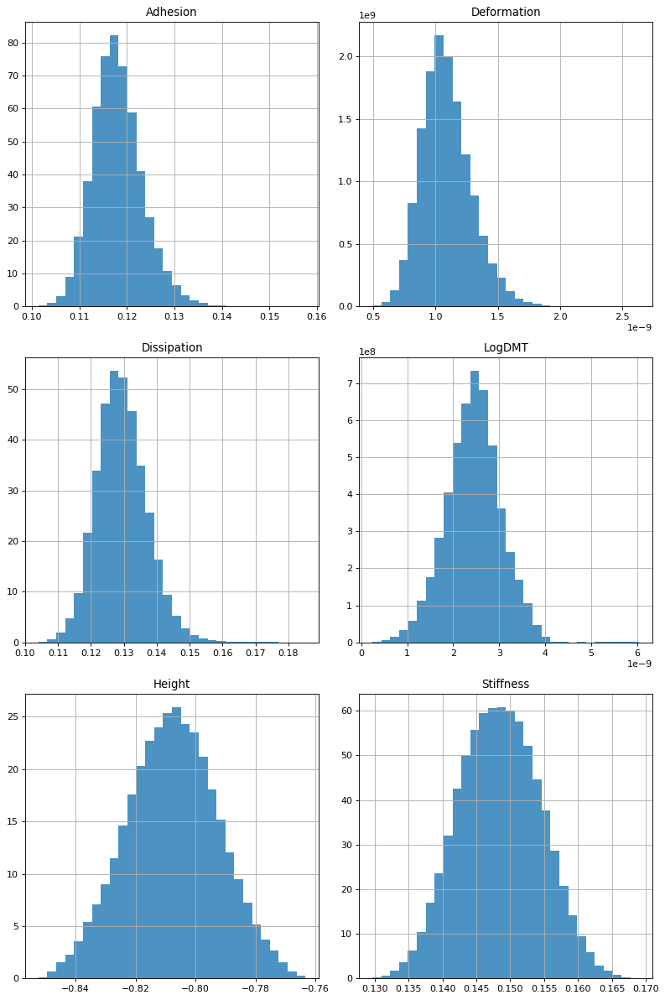

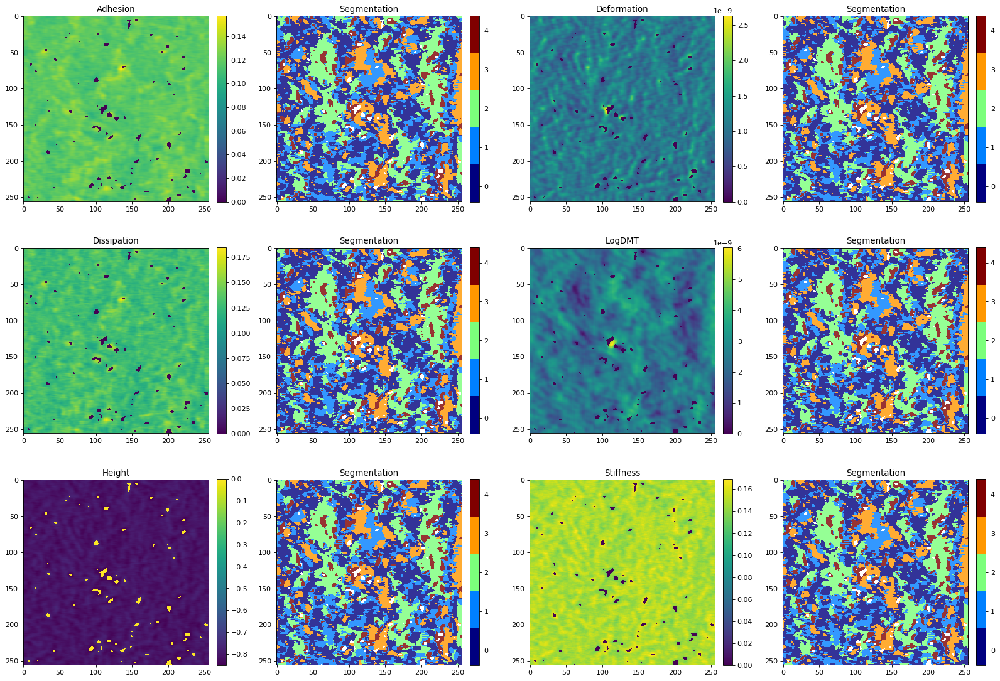

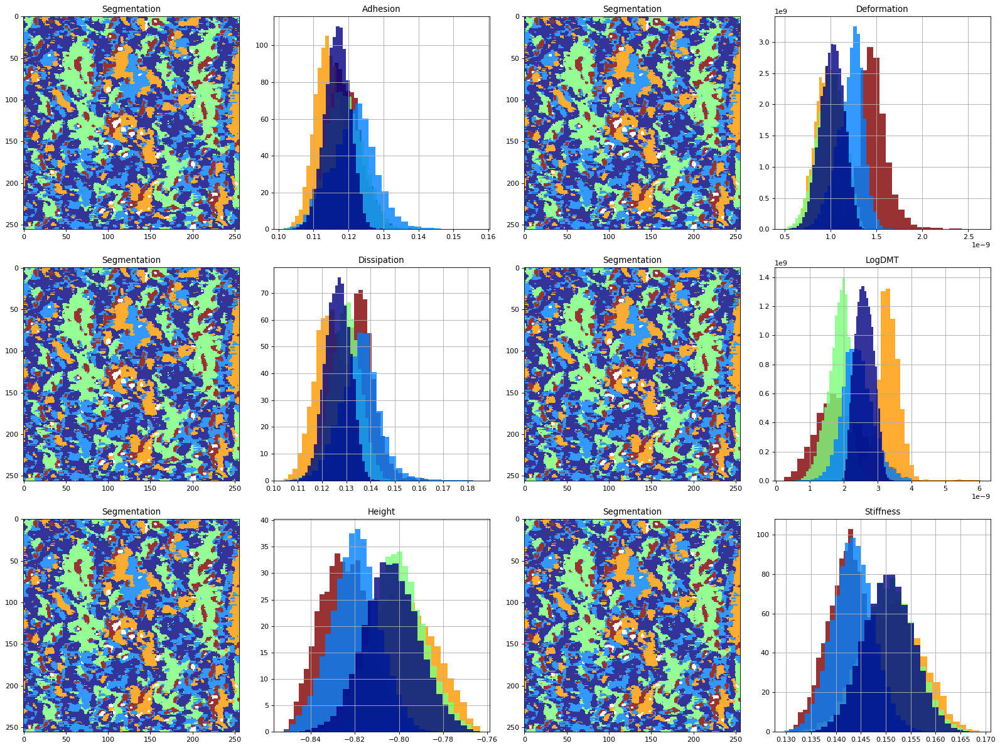

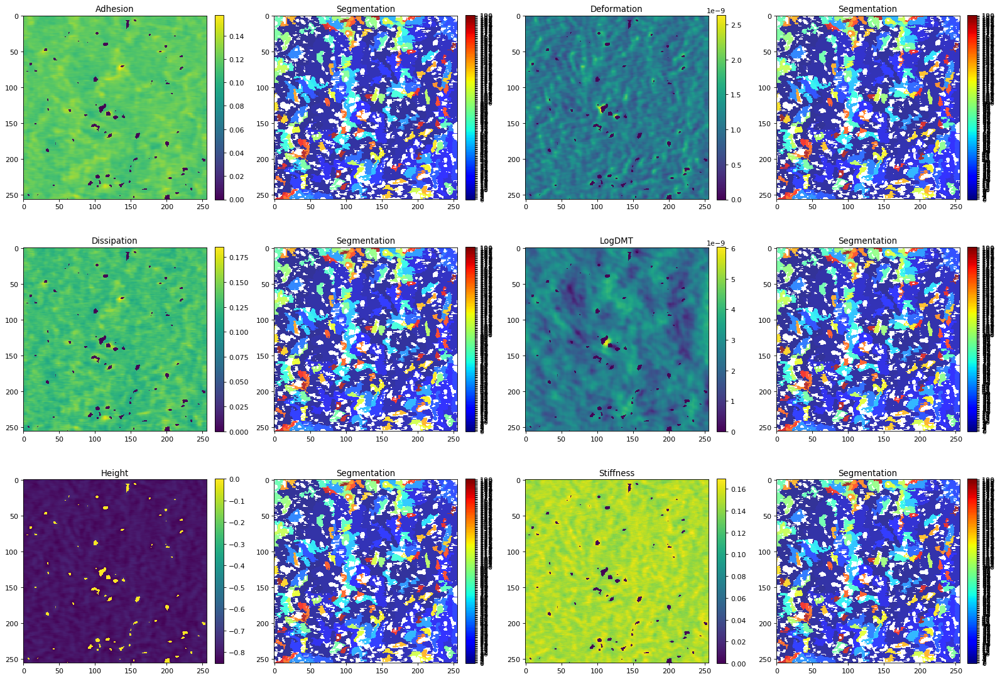

/anaconda3/lib/python3.7/site-packages/scipy/fftpack/basic.py:160: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.
  z[index] = x


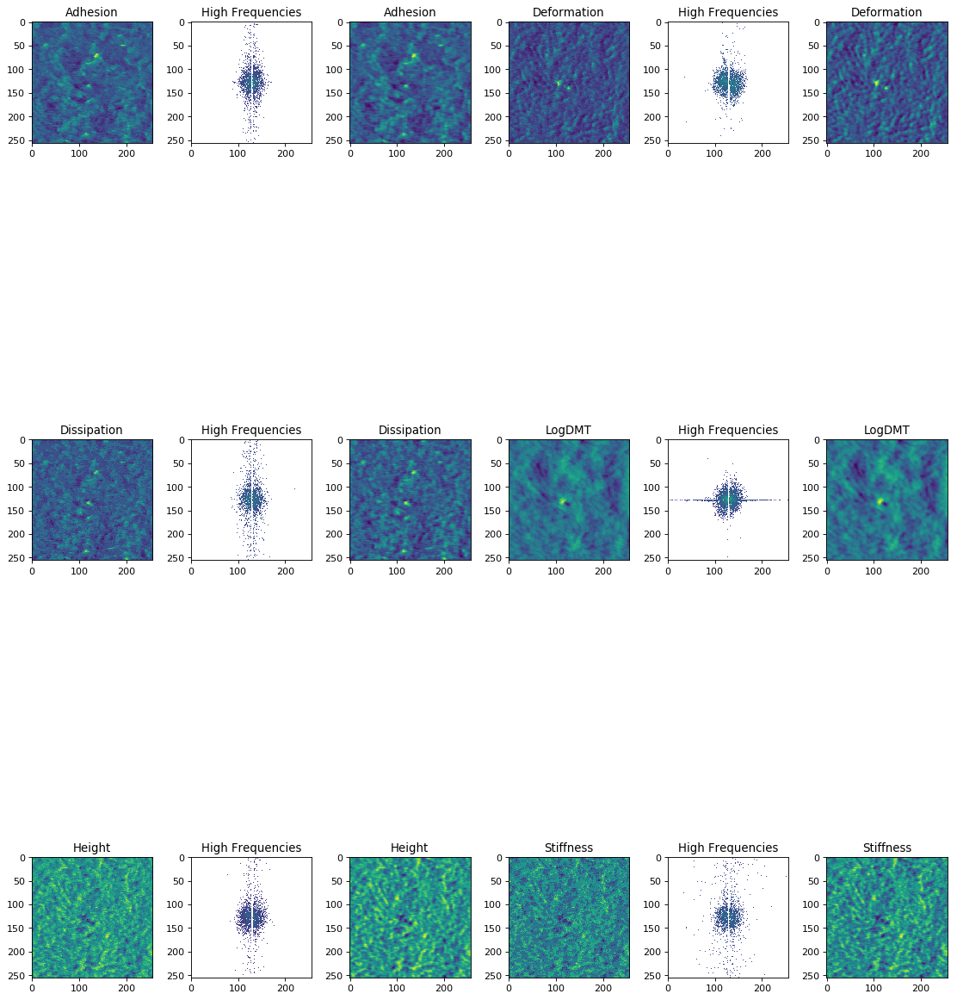

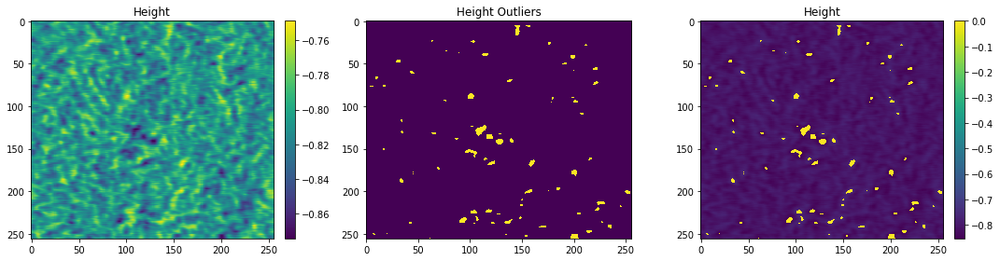

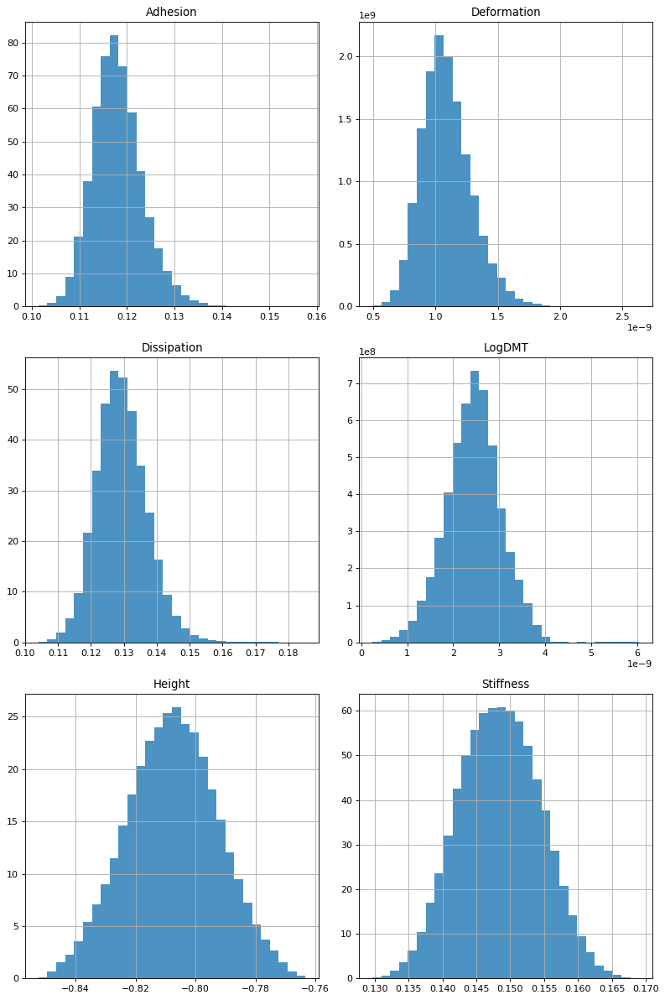

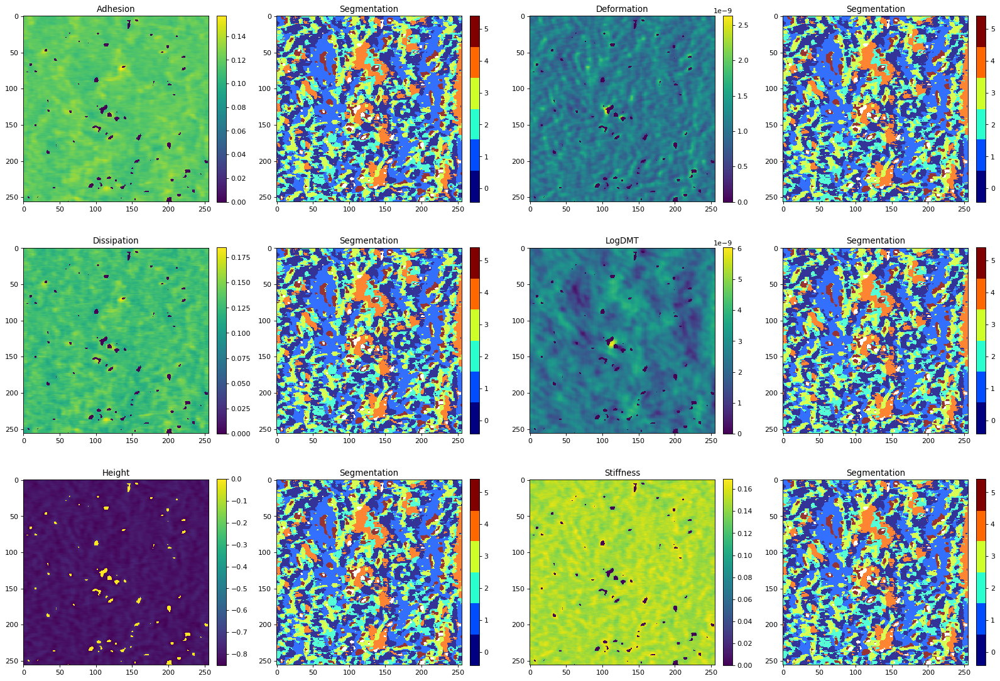

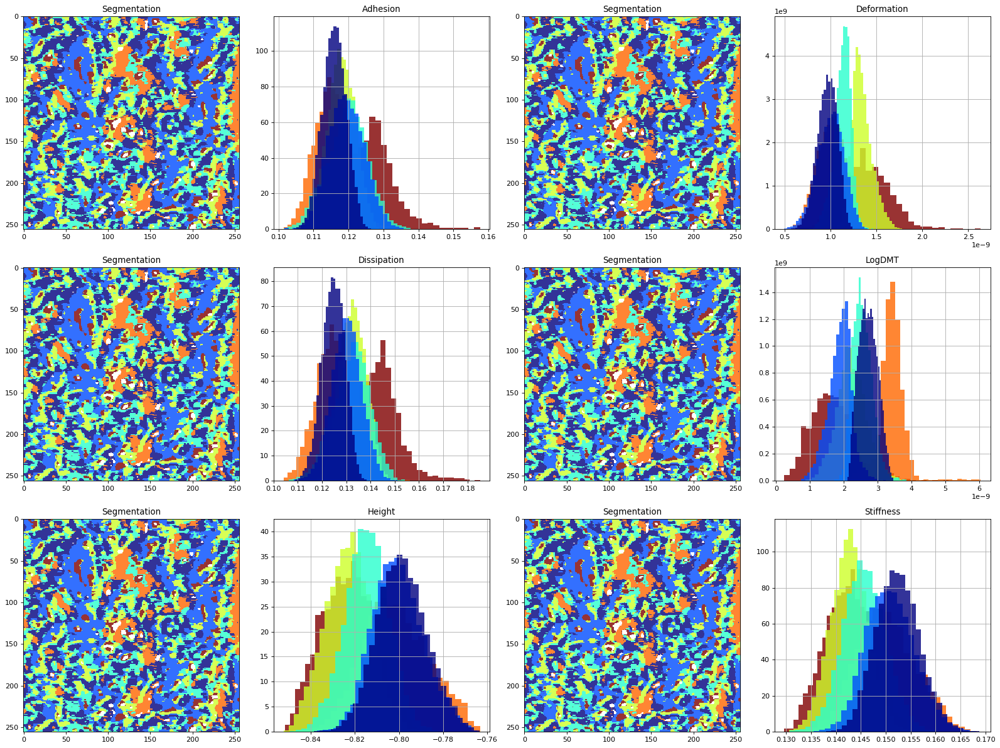

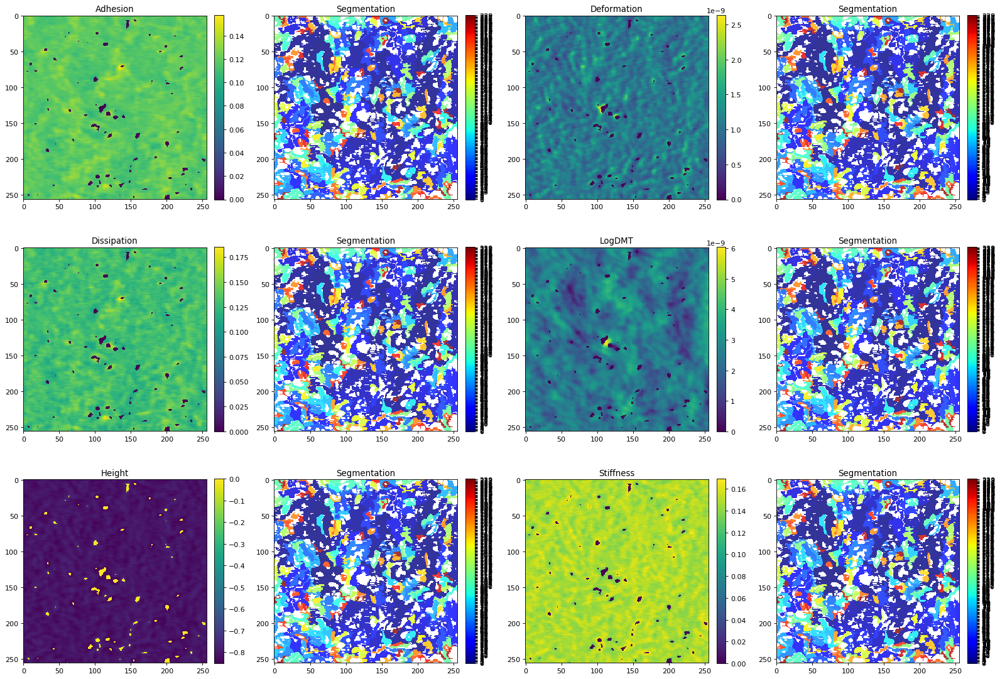

In [5]:
im = ims[2]

components = [1, 2, 3, 4, 5, 6]

heightless = False
padding = 0
embedding_dim = None
nonlinear = False
plots = True

p_stats = {}
g_stats = {}

for i in range(len(components)):
    outliers, seg1_labels, seg2_labels = ssts_pipeline(im, heightless = heightless, n_components = components[i],
                                                   padding = padding, embedding_dim = embedding_dim,
                                                   nonlinear = nonlinear, plots = plots)
    
    phases = sh.phase_sort(im,seg1_labels,n_components = components[i])
    p_stats[i] = sh.gen_phase_stats(phases)
    
    grains = sh.grain_sort(im, seg2_labels)
    g_stats[i] = sh.gen_grain_stats(grains)

In [6]:
p_stats

{0: {0: {0: (0.118355, 0.010206726622488706, 0.00010417726834621972),
   1: (1.37975e-09, 5.146145903858696e-10, 2.6482817663801636e-19),
   2: (0.13397, 0.018556308423765065, 0.00034433658231789436),
   3: (2.5026999999999996e-09, 8.199227089807304e-10, 6.722732487022996e-19),
   4: (-0.8427, 0.04509268128021306, 0.002033349905038877),
   5: (0.139415, 0.017124269675899036, 0.0002932406119329152)},
  1: {0: (0.11766, 0.005767780680874467, 3.326729398266873e-05),
   1: (1.0645e-09, 2.244601186134178e-10, 5.038234484794959e-20),
   2: (0.1286, 0.00949231902413078, 9.010412045587511e-05),
   3: (2.4538e-09, 6.098826057496855e-10, 3.7195679279602627e-19),
   4: (-0.80775, 0.01812755997044226, 0.0003286084304819806),
   5: (0.14799, 0.008177129808972372, 6.686545191278453e-05)}},
 1: {0: {0: (0.118355, 0.010206726622488706, 0.00010417726834621972),
   1: (1.37975e-09, 5.146145903858696e-10, 2.6482817663801636e-19),
   2: (0.13397, 0.018556308423765065, 0.00034433658231789436),
   3: (2.502

In [7]:
g_stats

{0: {1: {0: (0.11766, 0.005767780680874467, 3.326729398266873e-05),
   1: (1.0645e-09, 2.244601186134178e-10, 5.038234484794959e-20),
   2: (0.1286, 0.00949231902413078, 9.010412045587511e-05),
   3: (2.4538e-09, 6.098826057496855e-10, 3.7195679279602627e-19),
   4: (-0.80775, 0.01812755997044226, 0.0003286084304819806),
   5: (0.14799, 0.008177129808972372, 6.686545191278453e-05)},
  0: {0: (0.118355, 0.010206726622488706, 0.00010417726834621972),
   1: (1.37975e-09, 5.146145903858696e-10, 2.6482817663801636e-19),
   2: (0.13397, 0.018556308423765065, 0.00034433658231789436),
   3: (2.5026999999999996e-09, 8.199227089807304e-10, 6.722732487022996e-19),
   4: (-0.8427, 0.04509268128021306, 0.002033349905038877),
   5: (0.139415, 0.017124269675899036, 0.0002932406119329152)}},
 1: {1: {0: (0.11918, 0.003397715556946633, 1.1544471005917169e-05),
   1: (9.5992e-10, 1.372197999194753e-10, 1.8829273489940832e-20),
   2: (0.128, 0.006799112542159214, 4.622793136094672e-05),
   3: (2.2642e-09

### Confirm # of phases and grains for each iteration makes sense

In [8]:
for v in p_stats.values():
    print (len(v))

2
3
4
5
6
7


In [9]:
for v in g_stats.values():
    print (len(v))

2
281
610
1114
1218
1582


### Exploring dictionary levels

In [10]:
for k,v in p_stats.items():
    print (f"Image: {k}")
    for k1,v1 in v.items():
        print (f"phase: {k1}")
        phase = pd.DataFrame.from_dict(v1)
        for k2,v2 in phase.iteritems():
            print (qnm_fields[k2])
            print (f"median:{v2[0]}")
            print (f"std_dev: {v2[1]}")

Image: 0
phase: 0
Adhesion
median:0.118355
std_dev: 0.010206726622488706
Deformation
median:1.37975e-09
std_dev: 5.146145903858696e-10
Dissipation
median:0.13397
std_dev: 0.018556308423765065
Modulus
median:2.5026999999999996e-09
std_dev: 8.199227089807304e-10
Height
median:-0.8427
std_dev: 0.04509268128021306
Stiffness
median:0.139415
std_dev: 0.017124269675899036
phase: 1
Adhesion
median:0.11766
std_dev: 0.005767780680874467
Deformation
median:1.0645e-09
std_dev: 2.244601186134178e-10
Dissipation
median:0.1286
std_dev: 0.00949231902413078
Modulus
median:2.4538e-09
std_dev: 6.098826057496855e-10
Height
median:-0.80775
std_dev: 0.01812755997044226
Stiffness
median:0.14799
std_dev: 0.008177129808972372
Image: 1
phase: 0
Adhesion
median:0.118355
std_dev: 0.010206726622488706
Deformation
median:1.37975e-09
std_dev: 5.146145903858696e-10
Dissipation
median:0.13397
std_dev: 0.018556308423765065
Modulus
median:2.5026999999999996e-09
std_dev: 8.199227089807304e-10
Height
median:-0.8427
std_de

## Need to generate 6 graphs, one per mechanical property. X-axis tracks each iteration of workflow. Y-axis tracks median values of that graph's property for each grain or phase.

#### _e.g._ Each iteration has an additional phase in its classification. Function generates 6 plots that resemble:

            |           +  +  +  +
            |     +        +  +  +
            |        +  +     +  +
            |  +           +     +
            |        +        +  +
            |     +     +  +  +  +
            |        +  +  +  +  +
            |_______________________
               0  1  2  3  4  5  6
               x =(n-1 phases)

In [17]:
# {image:{phase:{property:values}}}
# {k1:{v1}}
#     {k2:{v2}}
#         {k3:v3}

def gen_prop_stats(stat_dict):
    ## for each key and image in this dictionary of phase stats:
    for k,v in p_stats.items():
    #     print (f"image: {k}")
        prop_stats = {}
        
        ## generate empty prop lists to hold prop[0] = median values, prop[1] = std_dev values
        adhesion = [[],[]]
        deformation = [[],[]]
        dissipation = [[],[]]
        modulus = [[],[]]
        height = [[],[]]
        stiffness = [[],[]]
        
        ##for each key and phase in this dictionary of mechanical property statistics
        ## (NOTE: In this case, number of GMM components in each image = # of median/std_dev values you collect)
        for k1, v1 in v.items():
    #         print (f"phase: {k1}")
            phase = pd.DataFrame.from_dict(v1)
        
            ## for each key and property in this dictionary of mechanical properties:
            for k2, v2 in phase.iteritems():
                ## collect relevant statistical values into corresponding property lists
                if k2 == 0:
                    adhesion[0].append(v2[0])
                    adhesion[1].append(v2[1])
                elif k2 == 1:
                    deformation[0].append(v2[0])
                    deformation[1].append(v2[1])
                elif k2 == 2:
                    dissipation[0].append(v2[0])
                    dissipation[1].append(v2[1])
                elif k2 == 3:
                    modulus[0].append(v2[0])
                    modulus[1].append(v2[1])
                elif k2 == 4:
                    height[0].append(v2[0])
                    height[1].append(v2[1])
                elif k2 == 5:
                    stiffness[0].append(v2[0])
                    stiffness[1].append(v2[1])
                else:
                    pass

        ## compile all of the property statistic lists into a set for each image         
            im_props = [np.asarray(adhesion), np.asarray(deformation), np.asarray(deformation),
                        np.asarray(modulus), np.asarray(height), np.asarray(stiffness)]

        ## compile all of the property stat dictionaries for this analysis loop and compile them into one dict    
        prop_stats[k] = im_props
        
    return prop_stats

In [18]:
prop_stats = gen_prop_stats(p_stats)

In [19]:
prop_stats

{5: [array([[0.118355  , 0.11978   , 0.12535   , 0.11806   , 0.11491   ,
          0.11914   , 0.11584   ],
         [0.01020673, 0.0062634 , 0.00821398, 0.0043816 , 0.00534665,
          0.00548285, 0.00393518]]),
  array([[1.37975000e-09, 1.12600000e-09, 1.39310000e-09, 1.33690000e-09,
          9.91690000e-10, 9.92220000e-10, 9.58340000e-10],
         [5.14614590e-10, 1.34319046e-10, 2.98054993e-10, 1.59394119e-10,
          1.66609974e-10, 1.71469624e-10, 1.35996913e-10]]),
  array([[1.37975000e-09, 1.12600000e-09, 1.39310000e-09, 1.33690000e-09,
          9.91690000e-10, 9.92220000e-10, 9.58340000e-10],
         [5.14614590e-10, 1.34319046e-10, 2.98054993e-10, 1.59394119e-10,
          1.66609974e-10, 1.71469624e-10, 1.35996913e-10]]),
  array([[2.50270000e-09, 2.53050000e-09, 1.59050000e-09, 2.22010000e-09,
          3.41825000e-09, 1.91675000e-09, 2.71830000e-09],
         [8.19922709e-10, 3.15144105e-10, 6.46919793e-10, 4.68689111e-10,
          4.03460918e-10, 3.67746436e-10, 

In [ ]:
## need to take plotting outside of loop to be able to plot all image stats together

## creating x-axis list of lists
X = [0,1,2,3,4,5,6]  
xx = []
for i in X:
    xx.append(np.full((1,(i+1)), i))
    
fig = plt.figure(figsize = (10,15))
## for each key and property stat dict:
for k,v in prop_stats.items():
#     print (v)
    
    ##for each property in the property stat dict:
    for i, prop in enumerate(v):
        print (prop)
        
        ## need to make yy = [[im0_p0], [im1_p0, im1_p1], [im2_p0, im2_p1, im2_p2],...]
        yy = prop[0]
        print (yy.shape)
        
        plt.subplot(3,2,i+1)
        plt.scatter(xx, yy)
        plt.ylim((prop[0].min()-(prop[0].min()*0.01)),(prop[0].max()+(prop[0].max()*0.01)))
        plt.title(qnm_fields[i])

    plt.tight_layout()
    plt.show()
#plot the gathered values for a given image

In [ ]:
props

### Now that the median, std dev, and var of each property of each phase and grain is calculated, these values need to be collected and plotted for the whole sample

#### For each dictionary (_i.e._ p_stats and g_stats), a plot for each property will be generated with the median of each phase or grain as the plotted data point.

#### std dev can be used to add error bars to these plots or plotted separately

# ~IS THIS REALLY NECESSARY??~

dictionary{
    adhesion{medians: (phase0, phase1, phase2, phase3)
             std_devs: (phase0, phase1, phase2, phase3)
             }
    deformation{medians: (phase0,...)
                ...}
    ...
}

In [ ]:
#Phases
def gen_phase_prop_stats(p_stats):
    """
    Takes in a dictionary of statistics for the phases of a given scan and sorts it into a sample-specific
    dictionary.
    
    Args:
    p_stats - dict. dictionary of dictionaries of arrays. Outer key corresponds to phase, inner key to property
    
    Returns:
    phase_prop_stats - dict. dictionary of dictionaries of lists. Outerkey corresponds to property, inner key 
    """
    phase_prop_stats = {}

    adhesion = {'median':[], 'std_dev':[]}
    deformation = {'median':[], 'std_dev':[]}
    dissipation = {'median':[], 'std_dev':[]}
    height = {'median':[], 'std_dev':[]}
    modulus = {'median':[], 'std_dev':[]}
    stiffness = {'median':[], 'std_dev':[]}

    for k, v in p_stats.items():
        adhesion['median'].append(v[0][0])
        adhesion['std_dev'].append(v[0][1])
        deformation['median'].append(v[1][0])
        deformation['std_dev'].append(v[1][1])
        dissipation['median'].append(v[2][0])
        dissipation['std_dev'].append(v[2][1])
        height['median'].append(v[3][0])
        height['std_dev'].append(v[3][1])
        modulus['median'].append(v[4][0])
        modulus['std_dev'].append(v[4][1])
        stiffness['median'].append(v[5][0])
        stiffness['std_dev'].append(v[5][1])

    phase_prop_stats.update({
        'adhesion':adhesion,
        'deformation':deformation,
        'dissipation':dissipation,
        'height':height,
        'modulus':modulus,
        'stiffness':stiffness})
    
    return phase_prop_stats

In [ ]:
#Grains

